In [1]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import FeatureAgglomeration
import matplotlib.pyplot as plt

In [26]:
sff_data = pd.read_csv('datasets/sff_loc.csv', index_col=False).to_numpy()[:,:]

In [27]:
scaler = StandardScaler()
sff_data_scaled = scaler.fit_transform(sff_data[:,2:])

In [28]:
sff_data[:5]

array([['HY_BIRCH1', 1, 0.0164393288, ..., 1.6080362452, 1.4815284961,
        1.9200002315],
       ['HY_BIRCH1', 2, 0.0138413181, ..., 0.2698282418, 1.1979589455,
        2.9399039175],
       ['HY_BIRCH1', 3, 0.0157151318, ..., 1.8711570782, 3.9337040082,
        -70.2670545423],
       ['HY_BIRCH1', 4, 0.0137162866, ..., 1.5806902341, 1.455460157,
        1.2272444159],
       ['HY_BIRCH1', 5, 0.0171580957, ..., 0.6181541872, 0.8589228436,
        2.5603564095]], dtype=object)

In [50]:
sff_data[:5]

array([['HY_BIRCH1', 1, 0.0164393288, ..., 1.6080362452, 1.4815284961,
        1.9200002315],
       ['HY_BIRCH1', 2, 0.0138413181, ..., 0.2698282418, 1.1979589455,
        2.9399039175],
       ['HY_BIRCH1', 3, 0.0157151318, ..., 1.8711570782, 3.9337040082,
        -70.2670545423],
       ['HY_BIRCH1', 4, 0.0137162866, ..., 1.5806902341, 1.455460157,
        1.2272444159],
       ['HY_BIRCH1', 5, 0.0171580957, ..., 0.6181541872, 0.8589228436,
        2.5603564095]], dtype=object)

In [20]:
sff_data[:,2:] = sff_data_scaled

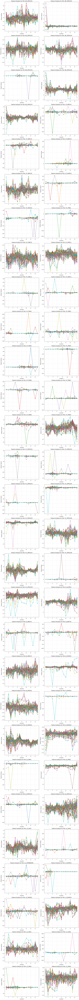

In [49]:
plot_names = sff_data[:, 0]  # First column: Plot name
locations = sff_data[:, 1]   # Second column: Location
start_column = 2000
end_column = 2100
feature_values = sff_data[:, start_column:end_column].astype(float)  # Feature columns (ensure numeric)

# Get unique plot names
unique_plot_names = np.unique(plot_names)

# Determine the layout of subplots (e.g., 2 rows and 2 columns)
num_plots = len(unique_plot_names)
rows = int(np.ceil(num_plots / 2))  # Adjust rows for 2 plots per row
cols = 2  # Number of columns

# Create the figure
fig, axes = plt.subplots(rows, cols, figsize=(14, 6 * rows))  # Adjust size based on the number of plots
axes = axes.flatten()  # Flatten in case of multi-dimensional axes

# Plot each plot name
for idx, plot_name in enumerate(unique_plot_names):
    # Filter data for the current plot name
    mask = plot_names == plot_name
    filtered_locations = locations[mask]
    filtered_feature_values = feature_values[mask]

    # Select the subplot
    ax = axes[idx]

    # Loop through each feature column
    num_features = filtered_feature_values.shape[1]
    for i in range(num_features):
        ax.plot(filtered_locations, filtered_feature_values[:, i], marker='o', label=f'Feature {i + 1}')

    # Customize the subplot
    ax.set_title(f'Feature Analysis for Plot: {plot_name}', fontsize=14)
    ax.set_xlabel('Location', fontsize=12)
    ax.set_ylabel('Feature Values', fontsize=12)
    ax.tick_params(axis='x', rotation=45)
    ax.grid(visible=True, linestyle='--', alpha=0.6)
    #ax.legend(title="Features", fontsize=10)

# Hide any unused subplots
for idx in range(len(unique_plot_names), len(axes)):
    axes[idx].axis('off')

# Tight layout and display
plt.tight_layout()
plt.savefig('plots/wavelength_{}_{}.png'.format(start_column, end_column), dpi=300, bbox_inches='tight')
plt.show()